In [98]:
import pyaudio
import os
import scipy 
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy.signal import butter, lfilter, freqz
import IPython
import pyroomacoustics as pra

In [99]:
# PATH = "audio/test-stereo-s21-.wav"
PATH = "audio/test-stereo-v2.wav"
# recorder at 48kHz

In [100]:
def display_left_right(audio_data):
    plt.figure(figsize=(15, 5))
    
    plt.subplot(2, 1, 1)
    plt.plot(audio_data[:,0], label='left')
    plt.plot(audio_data[:,1], label='right')

    plt.subplot(2, 1, 2)
    plt.plot(audio_data[:,0] - audio_data[:,1], label='diff')
    plt.legend()
    plt.show()

In [101]:
rate, data = scipy.io.wavfile.read(PATH)

In [102]:
c = 343
fs = 48000
mic_spacing = 0.16

differene = (mic_spacing / c) * fs
print(f"the difference in samples should be {differene} if the sound is coming from the left or the right with a 90deg angle")


the difference in samples should be 22.390670553935863 if the sound is coming from the left or the right with a 90deg angle


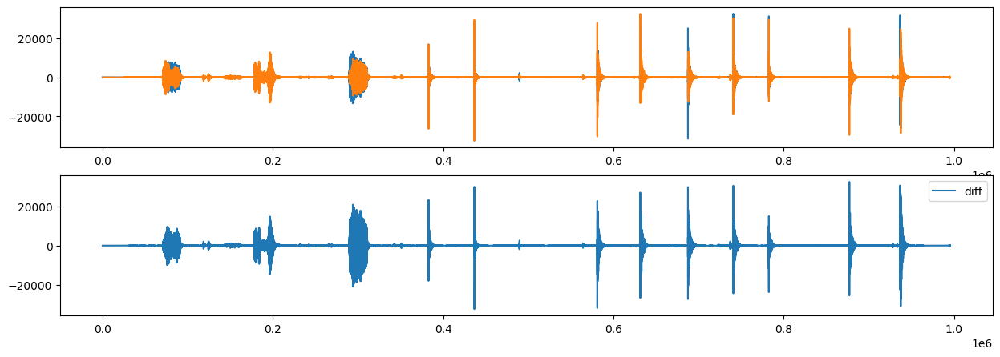

In [103]:
display_left_right(data)

In [104]:
IPython.display.Audio(PATH)

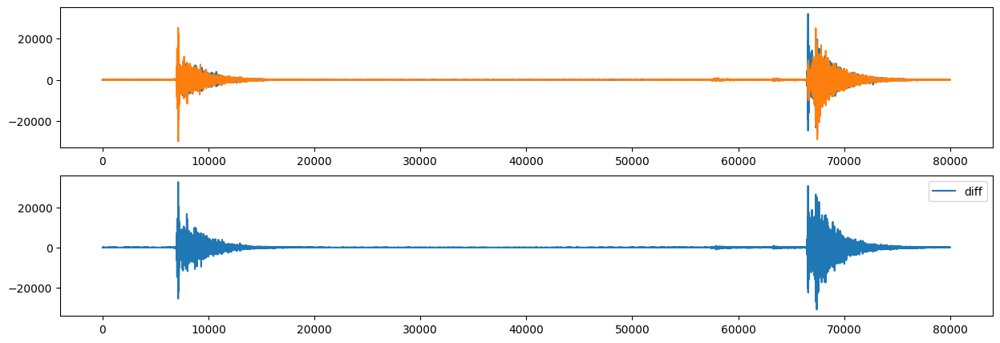

In [105]:
lr_clap_start = 870000
lr_clap_end = 950000
lr_clap = data[lr_clap_start:lr_clap_end]
display_left_right(lr_clap)

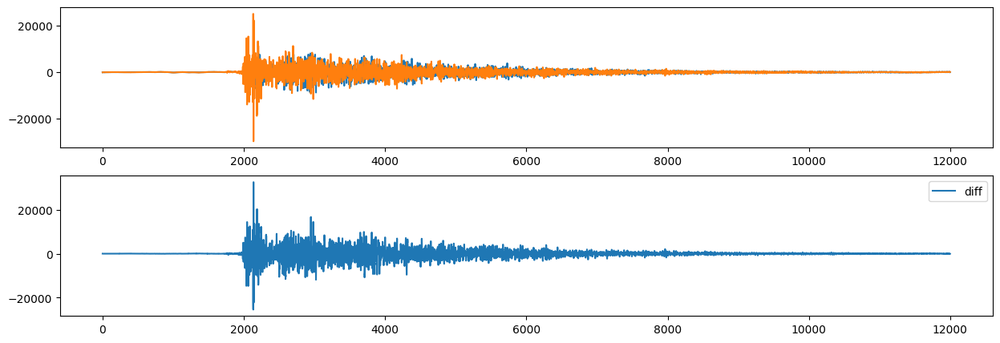

In [106]:
lr_clap_right = lr_clap[5000:17000]
display_left_right(lr_clap_right)

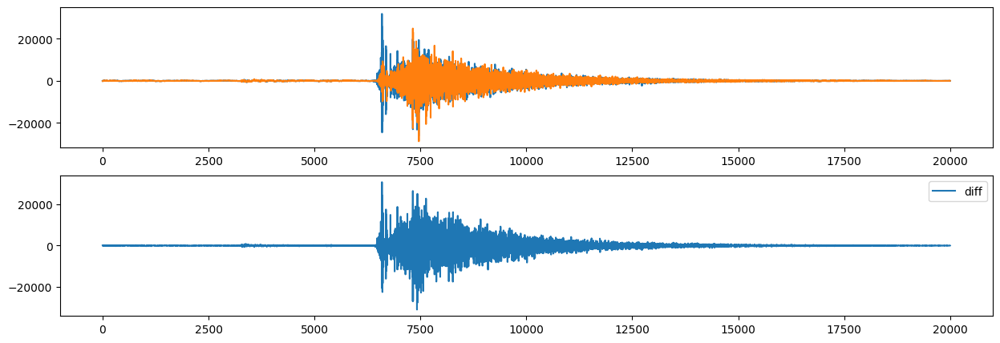

In [107]:
lr_clap_left = lr_clap[60000:80000]
display_left_right(lr_clap_left)

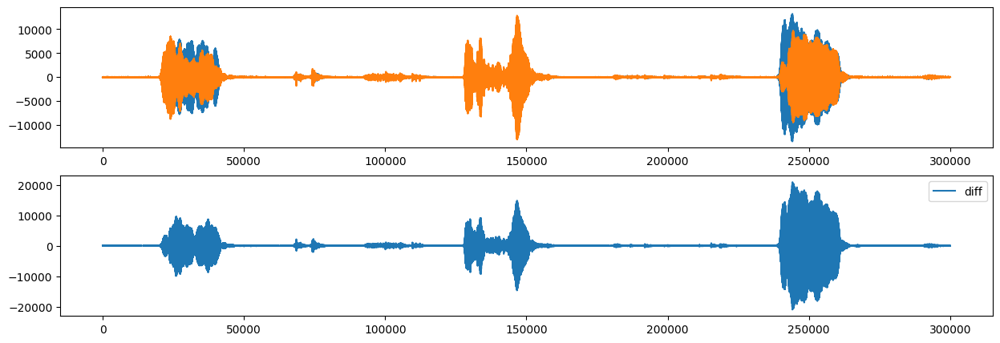

In [108]:
whistle_start = 50000
whistle_end = 350000
whistle = data[whistle_start:whistle_end]
display_left_right(whistle)

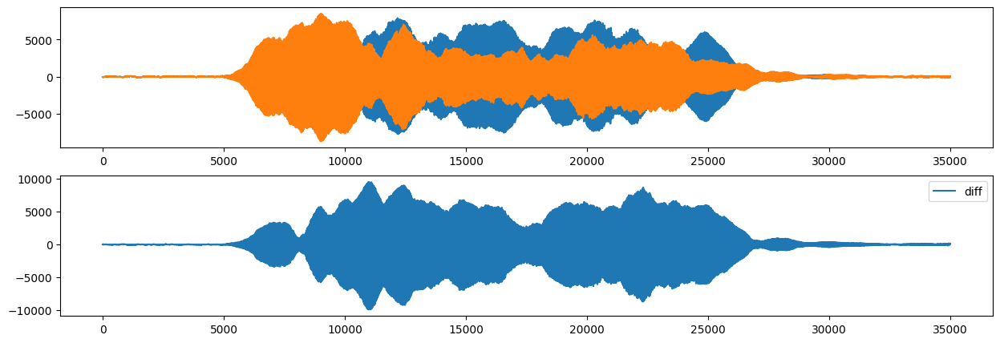

In [109]:
whistle_front = whistle[15000:50000]
display_left_right(whistle_front)


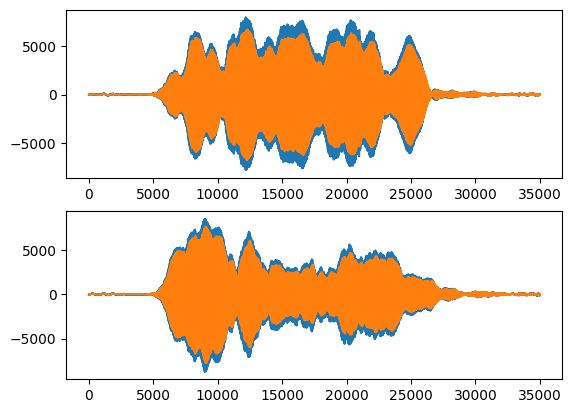

In [110]:
def butter_lowpass(cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return b, a

def butter_lowpass_filter(data, cutoff, fs, order=5):
    b, a = butter_lowpass(cutoff, fs, order=order)
    y = lfilter(b, a, data)
    return y

# Filter requirements.  
order = 10 
fs = rate       # sample rate, Hz
cutoff = 1500  # desired cutoff frequency of the filter, Hz

# Get the filter coefficients so we can check its frequency response.
b, a = butter_lowpass(cutoff, fs, order)

# Filter the data, and plot both the original and filtered signals.
yl = butter_lowpass_filter(whistle_front[:,0], cutoff, fs, order).astype(np.int16)
yr = butter_lowpass_filter(whistle_front[:,1], cutoff, fs, order).astype(np.int16)

plt.subplot(2, 1, 1)
plt.plot(whistle_front[:,0])
plt.plot(yl)
plt.subplot(2, 1, 2)
plt.plot(whistle_front[:,1])
plt.plot(yr)
plt.show()


In [111]:
def low_pass_filter_and_correlate(stereo_audio, order=10, rate = 48000, cutoff = 1500):
    b, a = butter_lowpass(cutoff, rate, order)
    yl = butter_lowpass_filter(stereo_audio[:,0], cutoff, rate, order).astype(np.int16)
    yr = butter_lowpass_filter(stereo_audio[:,1], cutoff, rate, order).astype(np.int16)

    # plot the base andio and filtered audio for left and right channels
    plt.subplot(3, 1, 1)
    plt.plot(stereo_audio[:,0])
    plt.plot(yl)
    plt.subplot(3, 1, 2)
    plt.plot(stereo_audio[:,1])
    plt.plot(yr)

    # compute and plot the correlation between the two channels
    res = np.correlate(yl[:], yr[:], mode='same')
    plt.subplot(3, 1, 3)
    plt.plot(res)

    plt.show()

    print(np.argmax(res)) # maximumu correlation
    
    return 

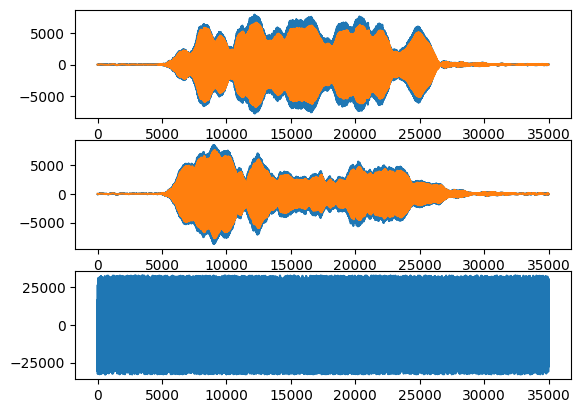

9927


In [112]:
low_pass_filter_and_correlate(whistle_front)

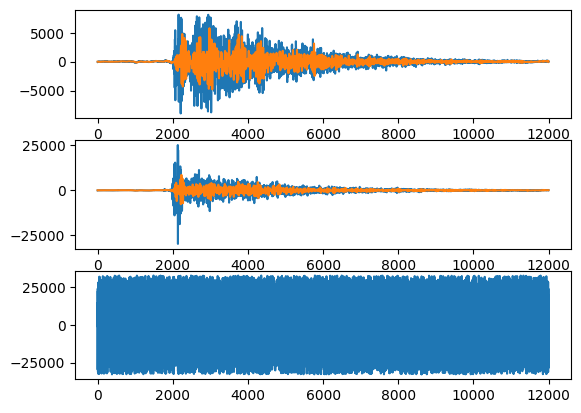

1487


In [113]:
low_pass_filter_and_correlate(lr_clap_right, cutoff=2000)

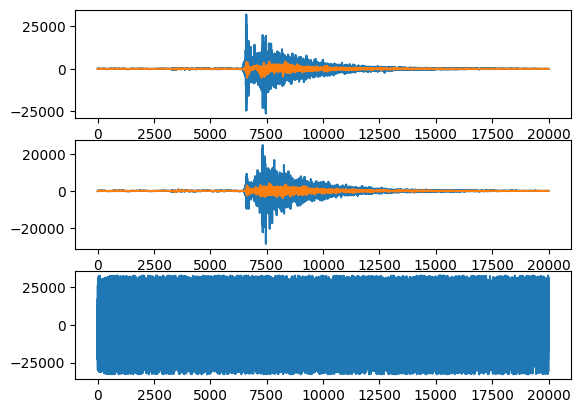

3179


In [114]:
low_pass_filter_and_correlate(lr_clap_left, cutoff=2000)

## Using a 1000hz sinwave

In [115]:
def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a

def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = lfilter(b, a, data)
    return y

In [116]:
def band_pass_filter_and_correlate(stereo_audio, order=10, rate = 48000, lowcut = 1000, highcut = 2000):
    b, a = butter_bandpass(lowcut, highcut, rate, order)
    yl = butter_bandpass_filter(stereo_audio[:,0], lowcut, highcut, rate, order).astype(np.int16)
    yr = butter_bandpass_filter(stereo_audio[:,1], lowcut, highcut, rate, order).astype(np.int16)

    # plot the base andio and filtered audio for left and right channels
    plt.subplot(3, 1, 1)
    plt.plot(stereo_audio[:,0])
    plt.plot(yl)
    plt.subplot(3, 1, 2)
    plt.plot(stereo_audio[:,1])
    plt.plot(yr)

    # compute and plot the correlation between the two channels
    res = np.correlate(yl[:], yr[:], mode='same')
    plt.subplot(3, 1, 3)
    plt.plot(res)

    plt.show()

    print(np.argmax(res)) # maximumu correlation
    
    return 

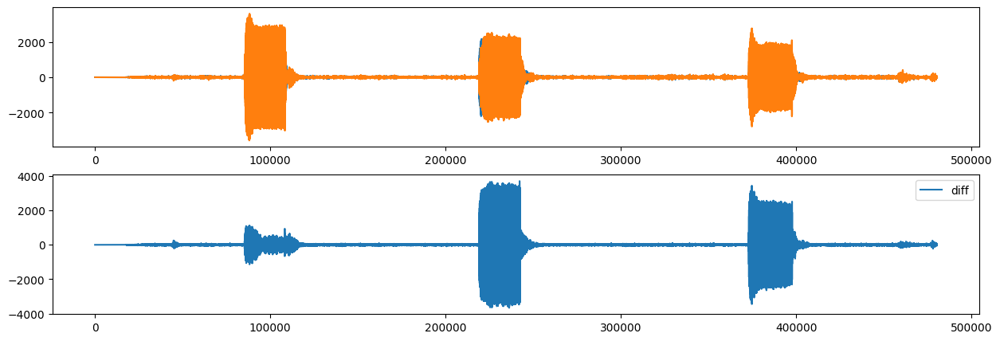

In [190]:
PATH1 = "audio/stereo-1000hz.wav"
rate, jouli = scipy.io.wavfile.read(PATH1)
display_left_right(data)

In [118]:
IPython.display.Audio(PATH1)

### Front bip

In [119]:
def first_peak(data, thresh_left, thresh_right):
    first_match_left = next((i for i, x in enumerate(data[:,0]) if x > thresh_left), None)
    first_match_right = next((i for i, x in enumerate(data[:,1]) if x > thresh_right), None)
    return first_match_left, first_match_right


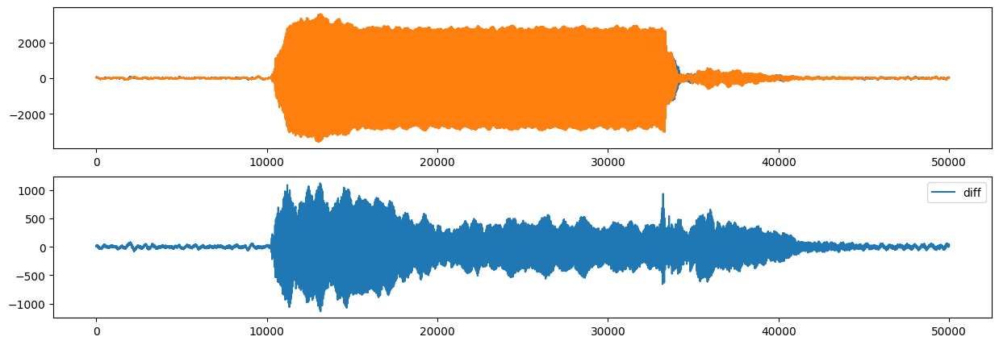

In [120]:
front_bip_start = 75000
front_bip_end = 125000
front_bip = data[front_bip_start:front_bip_end]

display_left_right(front_bip)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


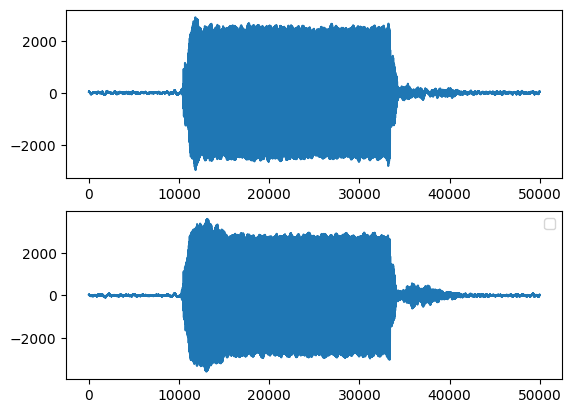

In [121]:
A = front_bip[:,0]
B = front_bip[:,1]


plt.subplot(2, 1, 1)
plt.plot(A)
plt.set_title = "left"
plt.subplot(2, 1, 2)
plt.plot(B)
plt.set_title = "right"
plt.legend()
plt.show()

/tmp/ipykernel_20784/914173643.py:1: DeprecationWarning: scipy.correlate is deprecated and will be removed in SciPy 2.0.0, use numpy.correlate instead
  corr = scipy.correlate(A/np.max(A), B/np.max(B), mode='same')


25001


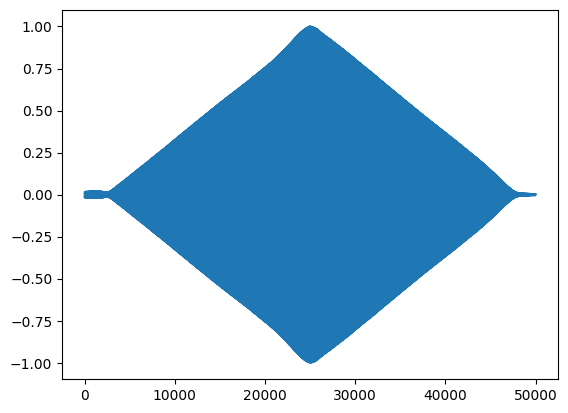

In [122]:
corr = scipy.correlate(A/np.max(A), B/np.max(B), mode='same')
corr = corr / np.max(corr)

plt.plot(corr)
print(np.argmax(corr))

In [123]:
front_bip_left, front_bip_right = first_peak(front_bip, 1000, 1000)
print(front_bip_left, front_bip_right)

10654 10505


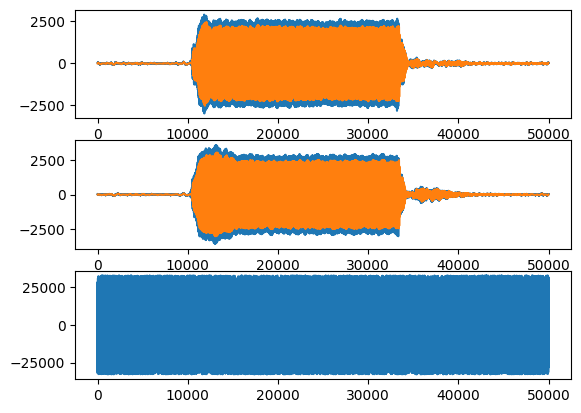

25294


In [124]:
low_pass_filter_and_correlate(front_bip, cutoff=1050) # using only the lowpass filter


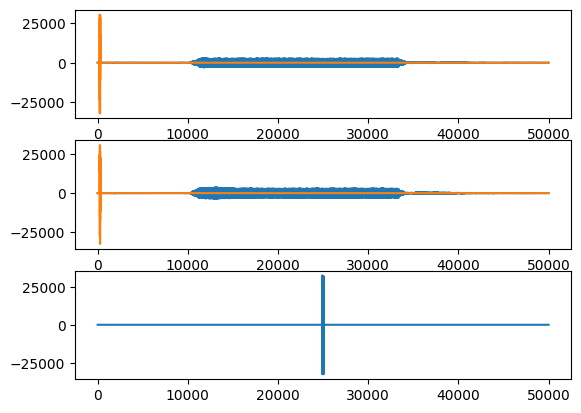

24914


In [125]:
band_pass_filter_and_correlate(front_bip, lowcut=990, highcut=1010) # using only the bandpass filter

### Looking at the energy of the signal

In [126]:
def compute_energy_ratio(data):
    return np.sum(data[:,0]**2)/np.sum(data[:,1]**2)

In [127]:
front_bip_left_energy = np.sum(front_bip[:,0]**2)
front_bip_right_energy = np.sum(front_bip[:,1]**2)

ratio = front_bip_left_energy / front_bip_right_energy

theta = np.arccos(np.sqrt(ratio))

print(ratio, theta)

1.0355796816035954 nan


/tmp/ipykernel_20784/3784586136.py:6: RuntimeWarning: invalid value encountered in arccos
  theta = np.arccos(np.sqrt(ratio))


### Left bip

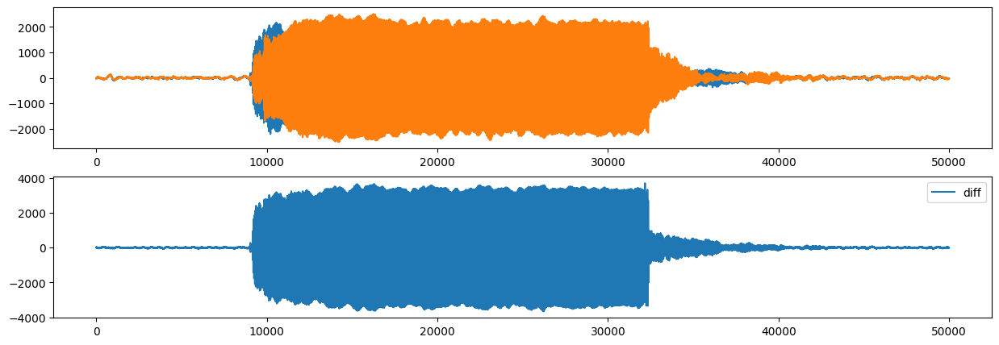

In [128]:
left_bip_start = 210000
left_bip_end = 260000
left_bip = data[left_bip_start:left_bip_end]

display_left_right(left_bip)

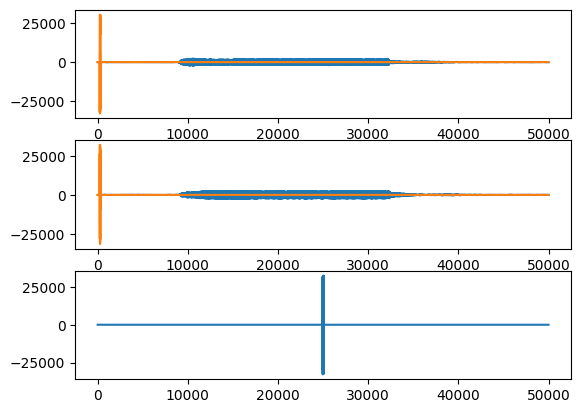

25043


In [129]:
band_pass_filter_and_correlate(left_bip, lowcut=990, highcut=1010) # using only the bandpass filter

In [130]:
left_left_bip, right_left_bip = first_peak(left_bip, 1000, 1000)
print(left_left_bip, right_left_bip)


9273 9581


In [131]:
print(compute_energy_ratio(left_bip))

0.8376119334870472


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


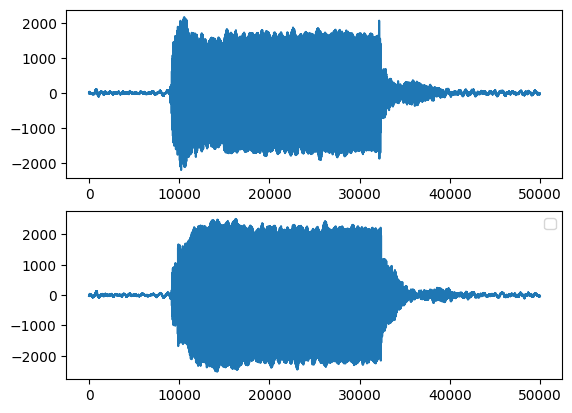

In [132]:
A = left_bip[:,0]
B = left_bip[:,1]

plt.subplot(2, 1, 1)
plt.plot(A)
plt.set_title = "left"
plt.subplot(2, 1, 2)
plt.plot(B)
plt.set_title = "right"
plt.legend()
plt.show()

/tmp/ipykernel_20784/914173643.py:1: DeprecationWarning: scipy.correlate is deprecated and will be removed in SciPy 2.0.0, use numpy.correlate instead
  corr = scipy.correlate(A/np.max(A), B/np.max(B), mode='same')


24360


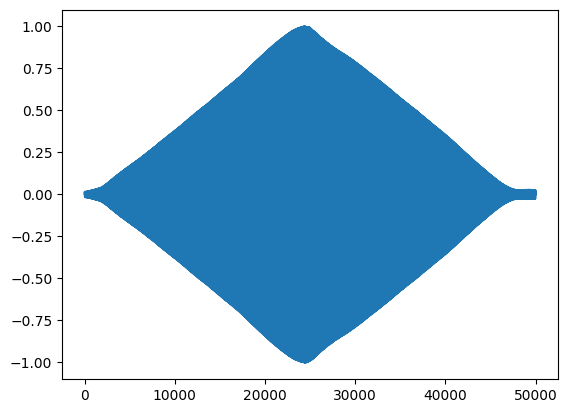

In [133]:
corr = scipy.correlate(A/np.max(A), B/np.max(B), mode='same')
corr = corr / np.max(corr)

plt.plot(corr)
print(np.argmax(corr))

### Right bip

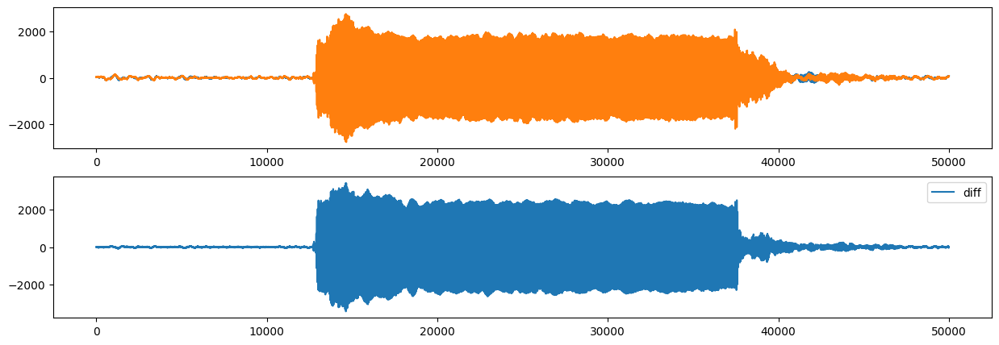

In [134]:
right_bip_start = 360000
right_bip_end = 410000
right_bip = data[right_bip_start:right_bip_end]

display_left_right(right_bip)

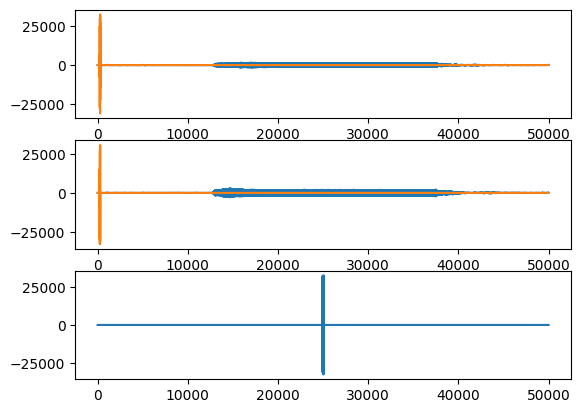

25084


In [135]:
band_pass_filter_and_correlate(right_bip, lowcut=990, highcut=1010) # using only the bandpass filter

In [136]:
print(compute_energy_ratio(right_bip))

0.9594999239806477


In [137]:
left_right_bip, right_right_bip = first_peak(right_bip, 1000, 1000)
print(left_right_bip, right_right_bip)


13465 12918


look at the first value 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


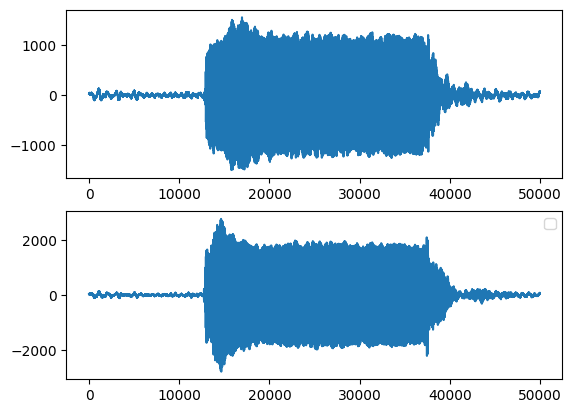

In [138]:
A = right_bip[:,0]
B = right_bip[:,1]

plt.subplot(2, 1, 1)
plt.plot(A)
plt.set_title = "left"
plt.subplot(2, 1, 2)
plt.plot(B)
plt.set_title = "right"
plt.legend()
plt.show()

25734


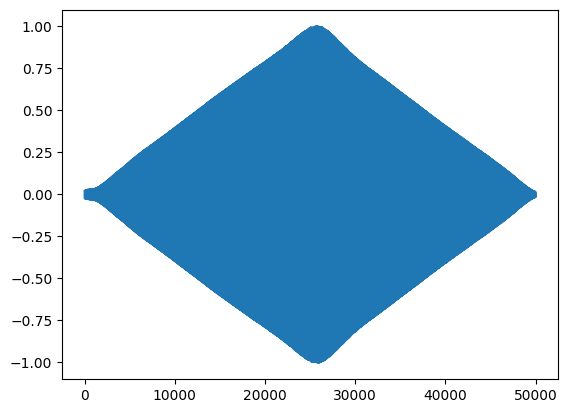

In [139]:
corr = scipy.signal.correlate(A/np.max(A), B/np.max(B), mode='same')
corr = corr / np.max(corr)

plt.plot(corr)
print(np.argmax(corr))

## Continuous bip left to right

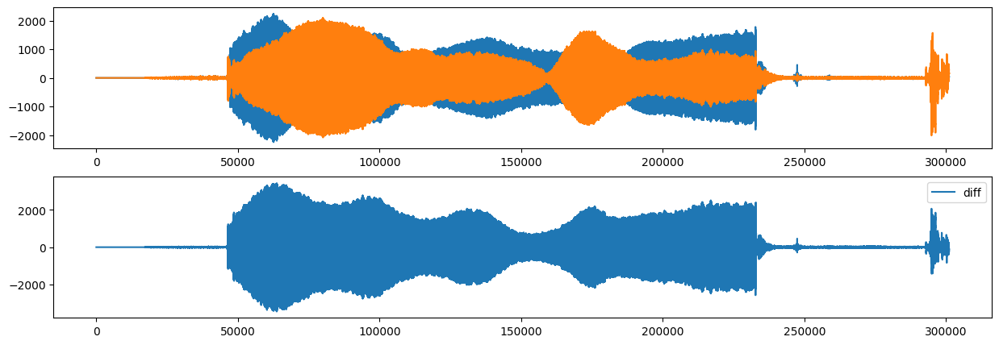

In [140]:
PATH2 = "audio/stereo-1000hz-continuous.wav"
rate, continuous = scipy.io.wavfile.read(PATH2)
display_left_right(continuous)

The minimum in the difference graph is when the sound souce is in front of the stereo mic.

In [141]:
IPython.display.Audio(PATH2)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


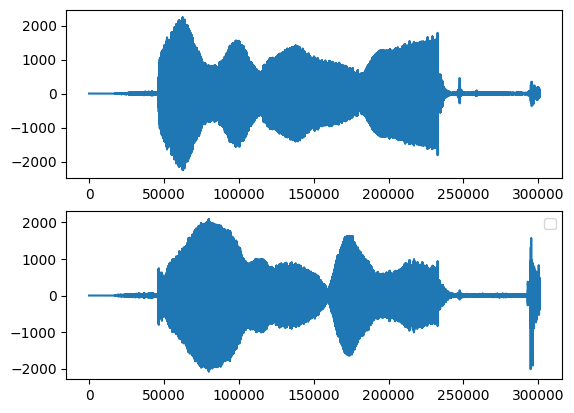

In [142]:
A = continuous[:,0]
B = continuous[:,1]

plt.subplot(2, 1, 1)
plt.plot(A)
plt.set_title = "left"
plt.subplot(2, 1, 2)
plt.plot(B)
plt.set_title = "right"
plt.legend()
plt.show()

/tmp/ipykernel_20784/630838720.py:10: RuntimeWarning: invalid value encountered in divide
  corr = scipy.correlate(A/np.max(A), B/np.max(B), mode='same')
/tmp/ipykernel_20784/630838720.py:10: DeprecationWarning: scipy.correlate is deprecated and will be removed in SciPy 2.0.0, use numpy.correlate instead
  corr = scipy.correlate(A/np.max(A), B/np.max(B), mode='same')


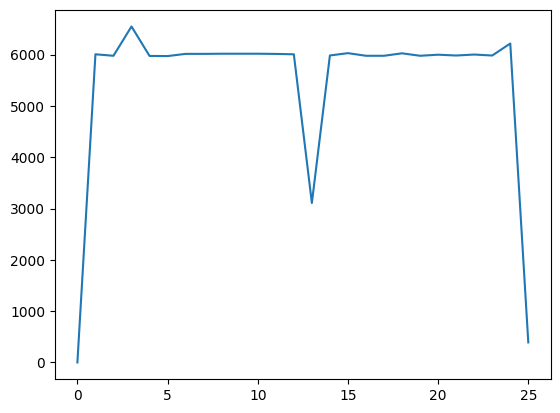

In [143]:
window_size = 12000

correlation = []


for i in range(0, len(continuous), window_size):
    window = continuous[i:i+window_size]
    A = window[:,0]
    B = window[:,1]
    corr = scipy.correlate(A/np.max(A), B/np.max(B), mode='same')
    corr = corr / np.max(corr)
    correlation.append(np.argmax(corr))

plt.plot(correlation)

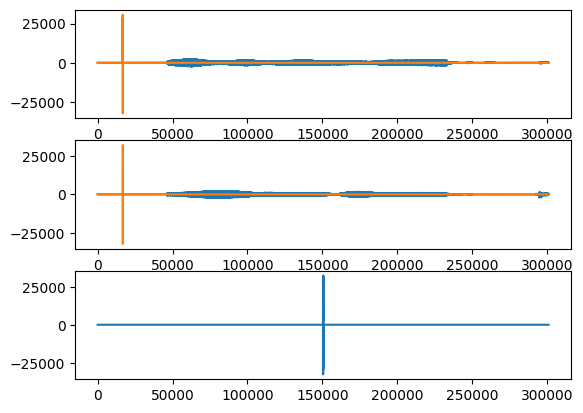

150547


In [144]:
band_pass_filter_and_correlate(continuous, lowcut=990, highcut=1010) # using only the bandpass filter

In [145]:
def compute_correaltion(data):
    return np.correlate(data[:,0], data[:,1])

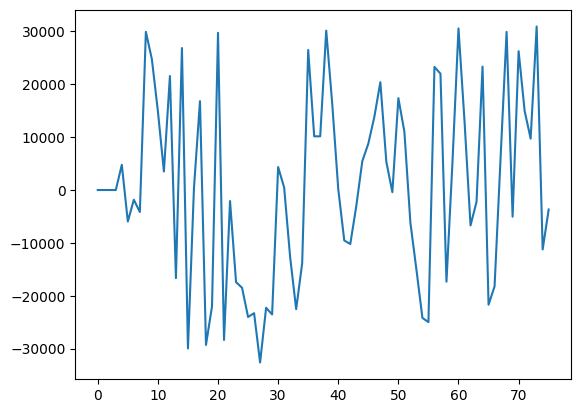

In [146]:
len(continuous)

window_size = 4000

correlation = []

for i in range(0, len(continuous), window_size):
    correlation.append(compute_correaltion(continuous[i:i+window_size]))

plt.plot(correlation)

In [147]:
IPython.display.Audio(PATH2)

## Second wave of tests

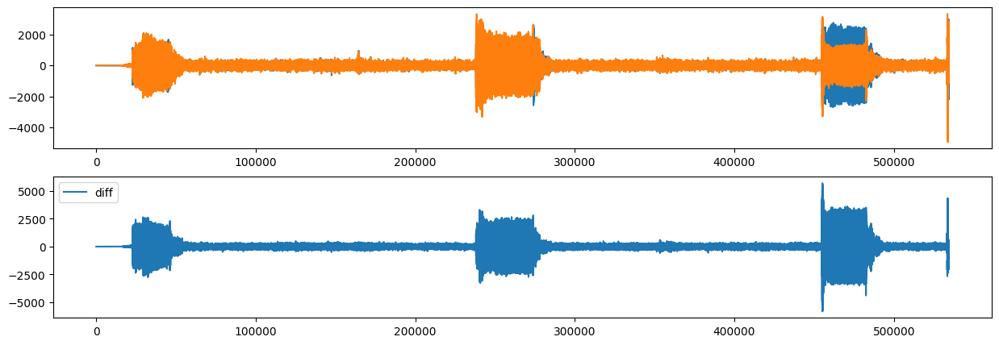

In [148]:
PATH = "audio/test 2/1m_1000hz_max.wav"
rate, data_1m_1000hz_max = scipy.io.wavfile.read(PATH)
display_left_right(data_1m_1000hz_max)

In [149]:
IPython.display.Audio(PATH)

In [150]:
mean = np.mean(data)

In [207]:
def test_correlation(data, low_freq=1000, high_freq=2000, window_size = 48000, step=4000, thresh = 4000):

    median = np.median(np.abs(data))
    print(median)
    mask = data > median
    data = data*mask
    #bandpass filter
    
    data[:,0] = butter_bandpass_filter(data[:,0], lowcut=low_freq, highcut=high_freq, fs=rate, order=6)
    data[:,1] = butter_bandpass_filter(data[:,1], lowcut=low_freq, highcut=high_freq, fs=rate, order=6)
    
    #normalize
    
    data = data.astype(np.float64)
    data[:,0] = data[:,0] / np.max(data[:,0])
    data[:,1] = data[:,1] / np.max(data[:,1])
    
    # all values under the median are set to 0
    median_0 = np.median(np.abs(data[:,0]))+0.15
    median_1 = np.median(np.abs(data[:,1]))+0.15
    mask_0 = np.abs(data[:,0]) > median_0
    mask_1 = np.abs(data[:,1]) > median_1
    data[:,0] = data[:,0]*mask_0
    data[:,1] = data[:,1]*mask_1
    
    #compute correlation
    window_size = window_size
    step = step

    #sliding window of size 48000 (1 second) that steps forward in time by 4000 steps at a time

    correlation = []
    time = []

    for i in range(0, len(data)-window_size, step):
        current_data = data[i:i+window_size]
        if np.median(np.abs(current_data)) > median:
            corr = scipy.signal.correlate(current_data[:,0], current_data[:,1], mode='same')
            corr = np.argmax(corr)
        else:
            corr = window_size/2
        
        # if corr > window_size/2 + thresh or corr < window_size/2 - thresh:
        #     corr = window_size/2  
        correlation.append(corr)
        time.append(i+window_size/2)
        print(f"looking at values from {i} to {i+window_size}")


    plt.figure(figsize=(15, 5))
    
    ax1 = plt.subplot(3, 1, 1)
    plt.plot(data[:,0], label='left')

    plt.subplot(3, 1, 2, sharex = ax1)
    plt.plot(data[:,1], label='right')

    plt.subplot(3, 1, 3, sharex = ax1)
    plt.plot(time, correlation)
    #plt.plot([0, window_size/2],[len(data), window_size/2], color='red')

    plt.show()
        
    


In [208]:
PATH = "audio/test 2/1m_yucef.wav"
rate, data_1m_yucef = scipy.io.wavfile.read(PATH)

In [209]:
PATH = "audio/test 2/4m_yucef.wav"
rate, data_4m_yucef = scipy.io.wavfile.read(PATH)

In [210]:
PATH = "audio/stereo-1000hz.wav"
rate, data_1000hz = scipy.io.wavfile.read(PATH)

25.0
looking at values from 0 to 48000
looking at values from 1000 to 49000
looking at values from 2000 to 50000
looking at values from 3000 to 51000
looking at values from 4000 to 52000
looking at values from 5000 to 53000
looking at values from 6000 to 54000
looking at values from 7000 to 55000
looking at values from 8000 to 56000
looking at values from 9000 to 57000
looking at values from 10000 to 58000
looking at values from 11000 to 59000
looking at values from 12000 to 60000
looking at values from 13000 to 61000
looking at values from 14000 to 62000
looking at values from 15000 to 63000
looking at values from 16000 to 64000
looking at values from 17000 to 65000
looking at values from 18000 to 66000
looking at values from 19000 to 67000
looking at values from 20000 to 68000
looking at values from 21000 to 69000
looking at values from 22000 to 70000
looking at values from 23000 to 71000
looking at values from 24000 to 72000
looking at values from 25000 to 73000
looking at values fr

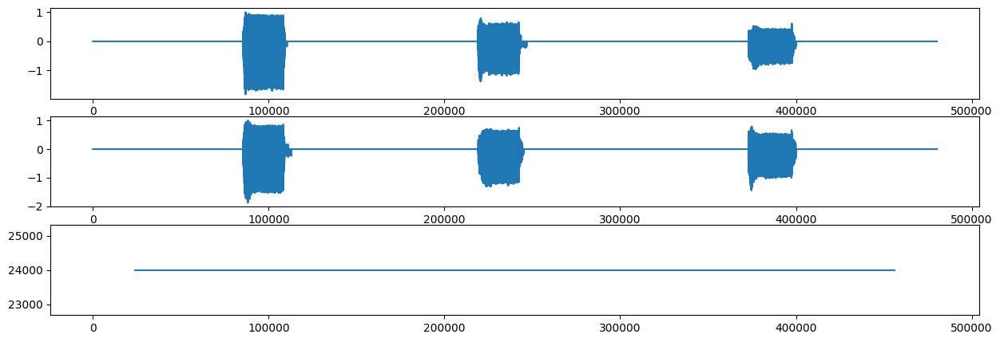

In [211]:
test_correlation(jouli, low_freq = 1000, high_freq = 4000, step = 1000, window_size=48000)

# With pyroomacoustics

In [105]:
# Location of sources
azimuth = np.array([61., 270.]) / 180. * np.pi
distance = 2.  # meters

In [106]:
c = 343.    # speed of sound
fs = 16000  # sampling frequency
nfft = 256  # FFT size
freq_range = [300, 3500]

In [131]:
snr_db = 5.    # signal-to-noise ratio
sigma2 = 10**(-snr_db / 10) / (4. * np.pi * distance)**2

# Create an anechoic room
room_dim = np.r_[10.,10.]
aroom = pra.ShoeBox(room_dim, fs=fs, max_order=0, sigma2_awgn=sigma2)

In [132]:
echo = pra.circular_2D_array(center=room_dim/2, M=1, phi0=0, radius=37.5e-3)
echo = np.concatenate((echo, np.array(room_dim/2, ndmin=2).T), axis=1)
aroom.add_microphone_array(pra.MicrophoneArray(echo, aroom.fs))

In [133]:
# Add sources of 1 second duration
rng = np.random.RandomState(23)
duration_samples = int(fs)

for ang in azimuth:
    source_location = room_dim / 2 + distance * np.r_[np.cos(ang), np.sin(ang)]
    source_signal = rng.randn(duration_samples)
    aroom.add_source(source_location, signal=source_signal)
    
# Run the simulation
aroom.simulate()

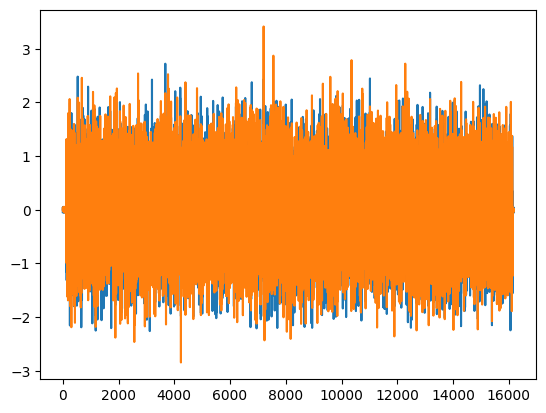

In [134]:
plt.plot(aroom.mic_array.signals.T)

In [110]:
X = pra.transform.stft.analysis(aroom.mic_array.signals.T, nfft, nfft // 2)
X = X.transpose([2, 1, 0])

#doa = pra.doa.algorithms["MUSIC"](echo, fs, nfft, c=c, num_src=2, max_four=4)
#
## this call here perform localization on the frames in X
#doa.locate_sources(X, freq_range=freq_range)

In [71]:
left_bip_norm = left_bip.astype(float)
left_bip_norm[:,0] = left_bip[:,0] / np.max(left_bip[:,0])
left_bip_norm[:,1] = left_bip[:,1] / np.max(left_bip[:,1])

In [72]:
left_bip_norm

array([[-0.00461681, -0.01153999],
       [-0.00692521, -0.00756068],
       [-0.00415512, -0.0103462 ],
       ...,
       [-0.00692521, -0.00477517],
       [-0.00646353, -0.00636689],
       [-0.00877193, -0.00596896]])

In [73]:
nfft = 8192
doa = pra.doa.algorithms['MUSIC'](L = np.array([[0, 0], [1e-1, 0]]), fs=rate, n_src=1, nfft = nfft)
X = pra.transform.stft.analysis(left_bip_norm, nfft, nfft // 2)
X = X.transpose([2, 1, 0])
doa.locate_sources(X, freq_range=[300, 3500])
spatial_resp = doa.grid.values

#normalize
min_val = spatial_resp.min()
max_val = spatial_resp.max()
spatial_resp = (spatial_resp - min_val) / (max_val - min_val)

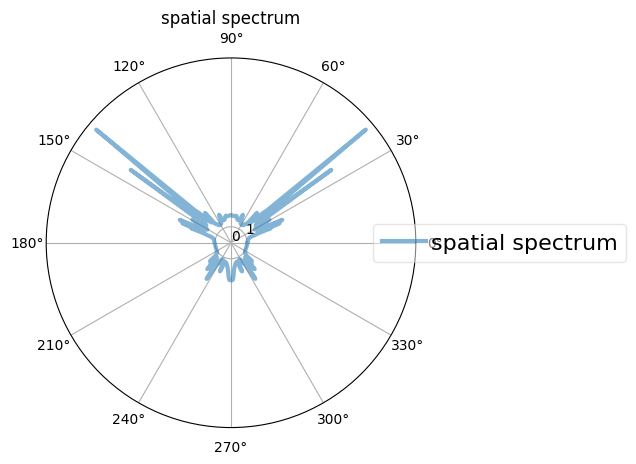

In [74]:
# plotting param
base = 1.
height = 10.
true_col = [0, 0, 0]

# loop through algos
phi_plt = doa.grid.azimuth

# plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='polar')
c_phi_plt = np.r_[phi_plt, phi_plt[0]]
c_dirty_img = np.r_[spatial_resp, spatial_resp[0]]
ax.plot(c_phi_plt, base + height * c_dirty_img, linewidth=3,
        alpha=0.55, linestyle='-',
        label="spatial spectrum")
plt.title("spatial spectrum")


handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, labels, framealpha=0.5,
            scatterpoints=1, loc='center right', fontsize=16,
            ncol=1, bbox_to_anchor=(1.6, 0.5),
            handletextpad=.2, columnspacing=1.7, labelspacing=0.1)

ax.set_xticks(np.linspace(0, 2 * np.pi, num=12, endpoint=False))
ax.xaxis.set_label_coords(0.5, -0.11)
ax.set_yticks(np.linspace(0, 1, 2))

ax.set_ylim([0, 1.05 * (base + height)])

plt.show()



In [214]:
# Create the microphone array object
mic_locs = np.array([[0, 0], [0.16, 0]])
array = pra.MicrophoneArray(mic_locs, fs)

In [221]:
# Compute the STFT of the audio signals
X = pra.transform.stft.STFT()

TypeError: only integer scalar arrays can be converted to a scalar index

In [ ]:
# Apply beamforming using the MUSIC algorithm
doa_estimator = pra.doa.MUSIC(
    array, fs, num_src=1, c=343, nfft=1024, num_iter=20
)
doa = doa_estimator(X)

In [ ]:

plt.figure()
ax = plt.subplot(111, projection="polar")
doa_estimator.polar_plt(doa, ax)
plt.title("Estimated DOA using MUSIC")
plt.show()